In [123]:
import nd2
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
#%matplotlib inline
from skimage import exposure
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io, plot, models
from scipy.ndimage import binary_erosion, binary_fill_holes
from matplotlib.gridspec import GridSpec
from scipy.signal import find_peaks
import subprocess
import os
import pandas as pd

import matplotlib.font_manager as fm
if 'Helvetica' not in [f.name for f in fm.fontManager.ttflist]:
    print("Helvetica font is not available. Please make sure Helvetica is installed on your system.")

In [81]:
nd2_path = '/Users/raphaeltinio/Desktop/test stacks/2007R_GLUT1_647_WGA_594_0002.nd2'

f = nd2.ND2File(nd2_path)

/var/folders/sl/syqsj8q94yn7kbv8l50mtwdw0000gn/T/ipykernel_40060/3717646830.py:3: UserWarning: ND2File file not closed before garbage collection. Please use `with ND2File(...):` context or call `.close()`.
  f = nd2.ND2File(nd2_path)


In [82]:
# Dimensions of image
print(f'{round(f.voxel_size().x, 2)} micron per pixel in x')
print(f'{round(f.voxel_size().y, 2)} micron per pixel in y')
print(f'{f.voxel_size().z} micron slice seperation')
print(f'{round(f.voxel_size().x * f.shape[-2],2)} microns by {round(f.voxel_size().y * f.shape[-1],2)} microns')

print(f'Image shape: {f.shape}')

0.12 micron per pixel in x
0.12 micron per pixel in y
0.15 micron slice seperation
125.97 microns by 125.97 microns
Image shape: (102, 4, 1024, 1024)


# Conversion to 8 bit

In [83]:
image = f.asarray()

'''
Converts image to 8bit, presumably from 16bit
'''

def to_8bit(image, do_scaling=True):
    if image.dtype != np.uint16:
        raise ValueError("Input image must be of dtype np.uint16")
    
    output_image = np.zeros(image.shape, dtype=np.uint8)
    
    if do_scaling:
        min_val = image.min()
        max_val = image.max()
        scale = 256.0 / (max_val - min_val + 1)
        output_image = ((image - min_val) * scale).clip(0, 255).astype(np.uint8)
    else:
        output_image = image.clip(0, 255).astype(np.uint8)
    
    return output_image


image = to_8bit(image)


# Channel Splitting

In [84]:
'''
Compresses the brightest pixels from the entire stack into one slice
'''

def max_proj(channel_zstack):
    channel_max = np.max(channel_zstack, axis = 0)
    return channel_max

'''
Applies "auto" from bright and contrast plug-in from FIJI
Does not follow the same algorithmn
'''
def auto_brightness_contrast(image):
    # Convert to float and normalize to range [0, 1]
    normalized_image = image.astype(np.float32) / 255.0
    equalized_image = exposure.equalize_adapthist(normalized_image)
    equalized_image = (equalized_image * 255).astype(np.uint8)
    
    return equalized_image

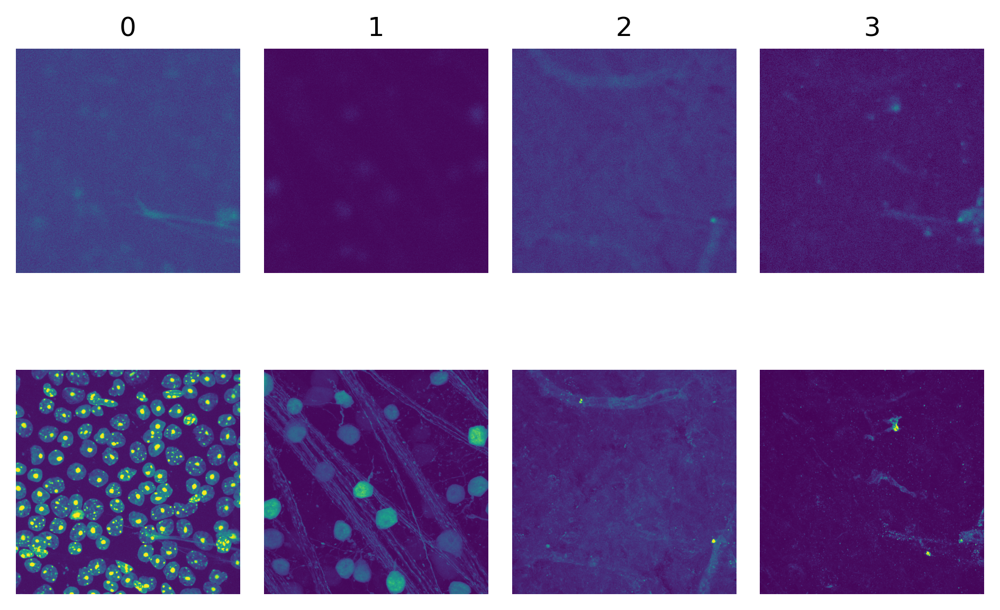

In [85]:
fig, axs = plt.subplots(2, 4)

for channel in range(image.shape[1]):
    axs[0, channel].imshow(image[int(image.shape[1]/2), channel])
    axs[0, channel].axis('off')
    axs[0, channel].set_title(channel)
    
    axs[1, channel].imshow(max_proj(image[:, channel, :, :]))
    axs[1, channel].axis('off')

plt.tight_layout()

In [86]:
DAPI_channel = 0
eGFP_channel = 1
WGA_channel = 2
GluT1_channel = 3

# Nuclei Z-Finding

Using the DAPI signal, we can essentially the middle of the cell wherever the DAPI signal peaks in z.

In [87]:
'''
Compresses the brightest pixels from the entire stack into one slice
'''

def max_proj(channel_zstack):
    channel_max = np.max(channel_zstack, axis = 0)
    return channel_max

'''
Applies "auto" from bright and contrast plug-in from FIJI
Does not follow the same algorithmn
'''
def auto_brightness_contrast(image):
    # Convert to float and normalize to range [0, 1]
    normalized_image = image.astype(np.float32) / 255.0
    equalized_image = exposure.equalize_adapthist(normalized_image)
    equalized_image = (equalized_image * 255).astype(np.uint8)
    
    return equalized_image


DAPI_stack = image[:, DAPI_channel, :, :]
DAPI_MP = max_proj(DAPI_stack)
DAPI_MP_enhanced = auto_brightness_contrast(DAPI_MP)

'''
Running maxprojection of DAPI Channel through CellPose
'''

model = models.CellposeModel(model_type='T5_DAPI_V1')
masks, flows, styles = model.eval(DAPI_MP_enhanced, diameter=None, channels=[0,0])

(-0.5, 1023.5, 1023.5, -0.5)

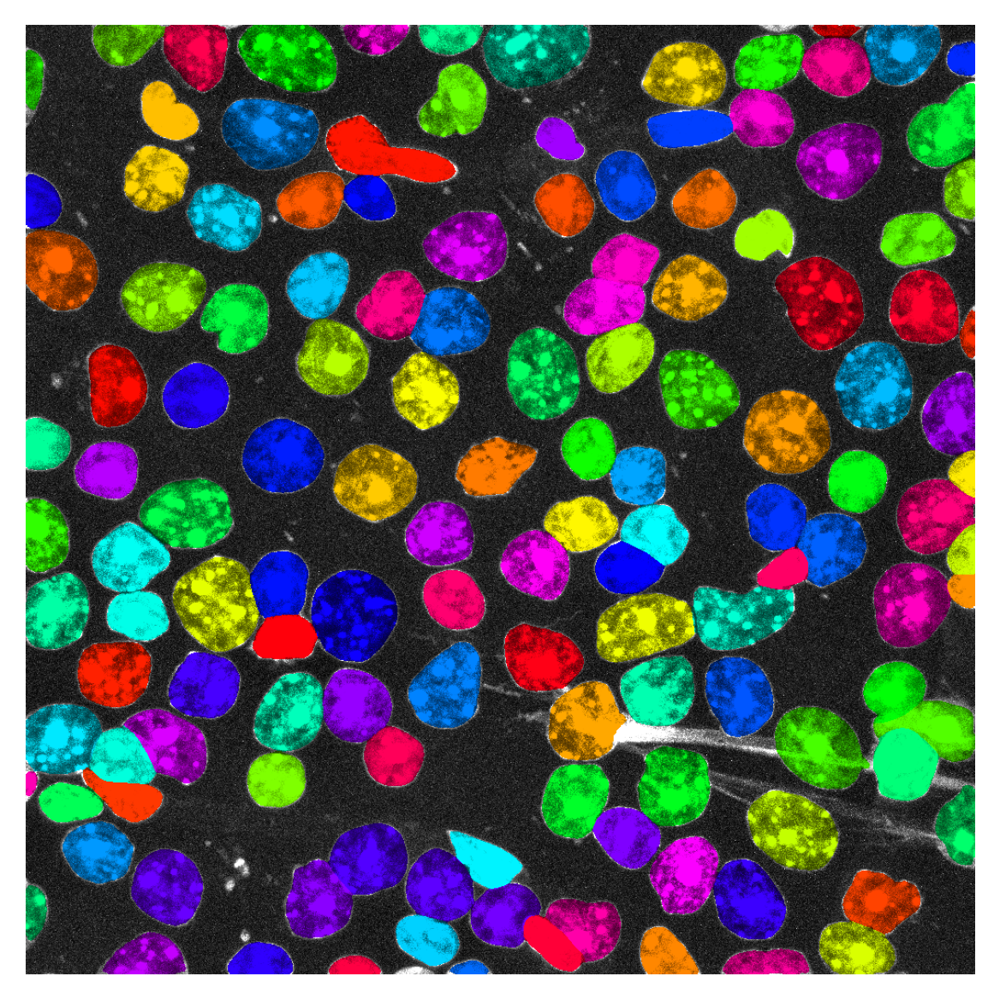

In [88]:
overlay = plot.mask_overlay(DAPI_MP_enhanced, masks)
plt.imshow(overlay)
plt.axis('off')

In [89]:
'''
Returning z indicies where the nuclei of each roi has the greatest intensity
'''

def nuclei_slices(single_channel, masks):

    total_masks = np.delete(np.unique(masks,0),0)
    number_slices = single_channel.shape[0]
    
    max_z_slices = []

    for mask in total_masks:
        single_mask = masks == mask
        
        intensity_max = 0
        intensity_max_slice = 0

        for slice in range(number_slices):
            layer_intensity = np.sum(image[slice,0][single_mask])

            if layer_intensity > intensity_max:
                intensity_max = layer_intensity
                intensity_max_slice = slice

        max_z_slices.append(intensity_max_slice)

    return max_z_slices

total_nuclei_slices = nuclei_slices(image[:,DAPI_channel,:,:], masks)

In [90]:
def cell_projector(single_channel, masks, nuclei_z_indicies):
    
    max_average = int(np.sum(total_nuclei_slices)/len(total_nuclei_slices))
    edited_image = single_channel[max_average].copy()
    base_image_display = single_channel[max_average].copy()
    total_masks = np.delete(np.unique(masks,0),0)

    for mask in total_masks:
        single_mask = masks == mask
        single_slice = nuclei_z_indicies[mask-1]

        edited_image[single_mask] = single_channel[single_slice][single_mask]

    return base_image_display, edited_image

DAPI_base, DAPI_projected = cell_projector(image[:,DAPI_channel,:,:], masks, total_nuclei_slices)
WGA_base, WGA_projected = cell_projector(image[:,WGA_channel,:,:], masks, total_nuclei_slices)

In [91]:
def plot_2images(before_image, after_image, auto_bc=False):
    
    if auto_bc:
        before_image = auto_brightness_contrast(before_image.copy())
        after_image = auto_brightness_contrast(after_image.copy())

    fig = plt.figure(figsize=(6, 6))
    gs = GridSpec(1, 2, figure=fig, wspace=0.05)

    ax0 = fig.add_subplot(gs[0, 0])
    ax1 = fig.add_subplot(gs[0, 1])

    ax0.imshow(before_image)
    ax0.axis('off')
    ax0.set_title('Base Image')

    ax1.imshow(after_image)
    ax1.axis('off')
    ax1.set_title('Edited Image')

    plt.show()

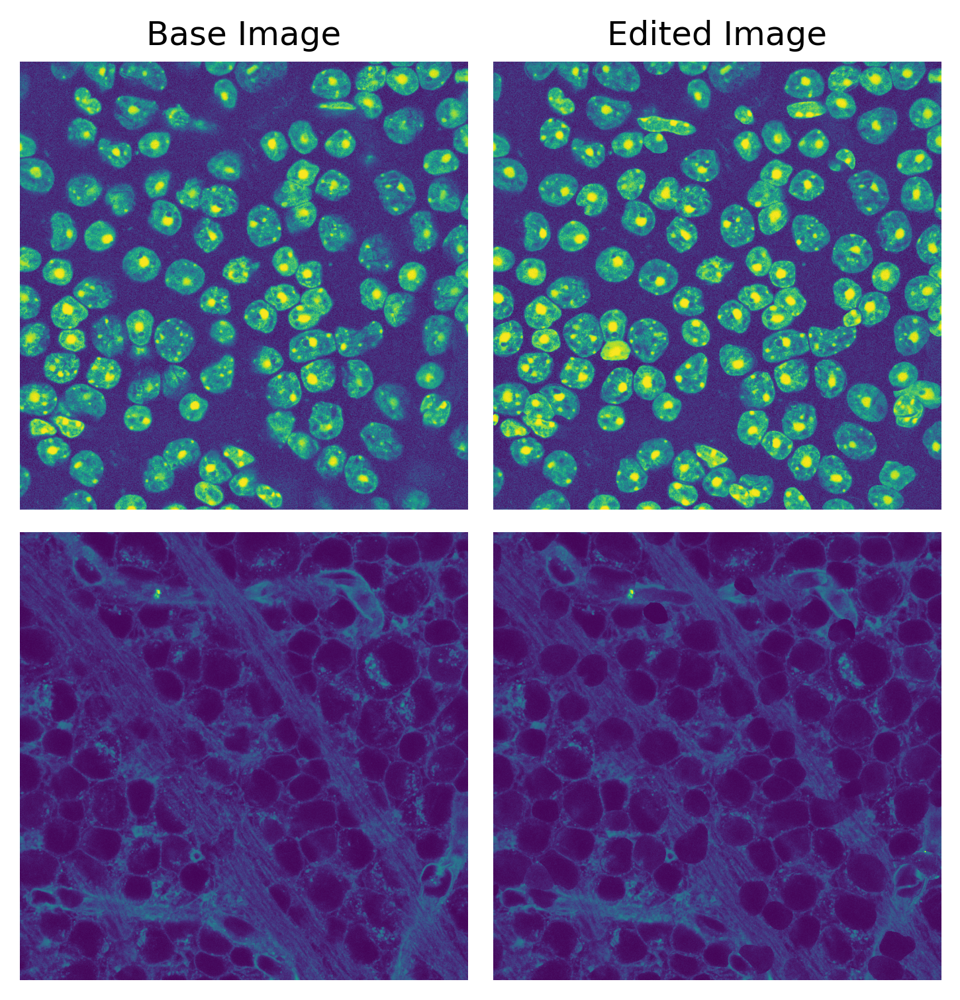

In [92]:
def plot_4images(before_images, after_images, auto_bc=False):

    c1_before, c2_before = before_images
    c1_after, c2_after = after_images
    
    if auto_bc:
        c1_before = auto_brightness_contrast(c1_before.copy())
        c2_before = auto_brightness_contrast(c2_before.copy())
        c1_after = auto_brightness_contrast(c1_after.copy())
        c2_after = auto_brightness_contrast(c2_after.copy())

    fig = plt.figure(figsize=(6, 6))
    gs = GridSpec(2, 2, figure=fig, wspace=0.05, hspace=0.05)

    ax0 = fig.add_subplot(gs[0, 0])
    ax1 = fig.add_subplot(gs[0, 1])
    ax2 = fig.add_subplot(gs[1, 0])
    ax3 = fig.add_subplot(gs[1, 1])

    ax0.imshow(c1_before)
    ax0.axis('off')
    ax0.set_title('Base Image')

    ax1.imshow(c1_after)
    ax1.axis('off')
    ax1.set_title('Edited Image')

    ax2.imshow(c2_before)
    ax2.axis('off')

    ax3.imshow(c2_after)
    ax3.axis('off')

    plt.show()

plot_4images([DAPI_base, WGA_base], [DAPI_projected, WGA_projected], auto_bc = True)

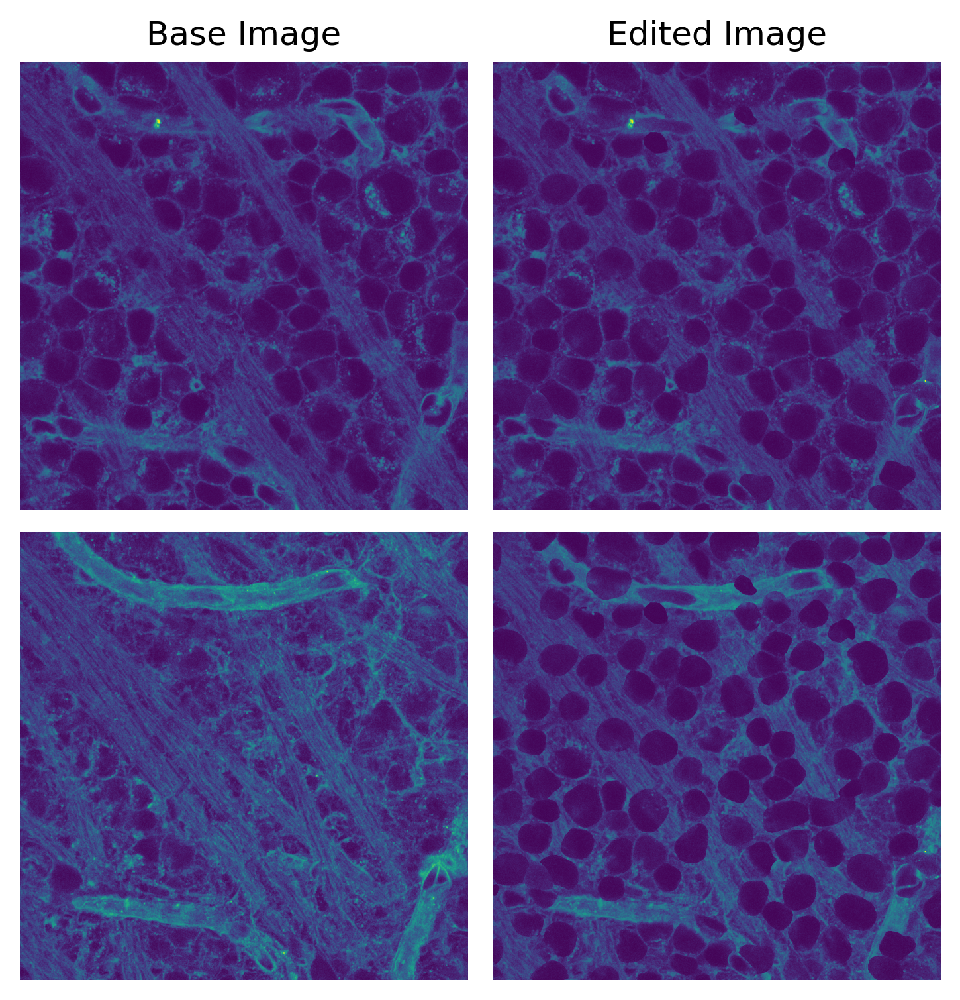

In [93]:
def cell_proj_vein(channel_stack, masks, nuclei_zs):
    '''
    Set up for background image to include veins and axon bundles
    * the slice is chosen as the slice between the ILM and Nuclei layer
    '''
    z_intensities = np.sum(channel_stack, axis=(1, 2))
    
    ILM_layer = int(np.argmax(z_intensities)) / 2
    nuclei_layer = np.sum(nuclei_zs) // len(nuclei_zs)

    vein_axon_layer = int((ILM_layer + nuclei_layer) / 2)

    edited_image = channel_stack[vein_axon_layer, :, :].copy()
    image_background_display = channel_stack[vein_axon_layer, :, :].copy()

    total_masks = np.delete(np.unique(masks, 0), 0)

    '''
    Cell Projection, the center of each cell is brought up
    '''

    # Editing each ROI so we are centered at the middle of each soma
    for mask in total_masks:
        single_mask = masks == mask
        single_slice = nuclei_zs[mask - 1]
        edited_image[single_mask] = channel_stack[single_slice][single_mask]

    return edited_image, image_background_display

vein_after, vein_before = cell_proj_vein(image[:,WGA_channel], masks, total_nuclei_slices)

plot_2images([WGA_base, vein_before], [WGA_projected, vein_after], auto_bc = True)

    


In [203]:
def create_dataframe(image, masks, channels=None):
    # Default channels if none are provided
    if channels is None:
        DAPI_channel = 0
        eGFP_channel = 1
        WGA_channel = 2
        GluT1_channel = 3

        channels = {
            'DAPI': DAPI_channel,
            'eGFP': eGFP_channel,
            'WGA': WGA_channel,
            'GluT1': GluT1_channel
        }
    
    # Initialize lists to store the data
    summed_values_list = []
    mask_id_list = []
    channel_list = []

    # Iterate through the channels and masks
    for channel_name, channel_index in channels.items():
        current_channel = image[:, channel_index, :, :]

        for mask_id in np.unique(masks):
            current_mask = masks == mask_id
            masked_stack = current_channel * current_mask
            summed_values = np.sum(masked_stack, axis=(1, 2))

            # Append the data to the lists
            summed_values_list.append([summed_values.tolist()])
            mask_id_list.append(mask_id)
            channel_list.append(channel_name)

    # Create a DataFrame from the collected data
    data = {
        'Y_vals': summed_values_list,
        'mask_id': mask_id_list,
        'Stain': channel_list
    }
    df = pd.DataFrame(data)

    return df

# Example usage:
# Assuming 'image' and 'masks' are already defined as numpy arrays
df = create_dataframe(image, masks)
print(df)

                                                Y_vals  mask_id  Stain
0    [[6725380, 6801658, 6860561, 6950194, 7102327,...        0   DAPI
1    [[32433, 32575, 32881, 33255, 33216, 33763, 34...        1   DAPI
2    [[51820, 51819, 52528, 53023, 54275, 55025, 55...        2   DAPI
3    [[81420, 82389, 83000, 84798, 86784, 89002, 89...        3   DAPI
4    [[22181, 22191, 22046, 22705, 22375, 23000, 23...        4   DAPI
..                                                 ...      ...    ...
543  [[1419, 1690, 1925, 2281, 2749, 3160, 3773, 57...      132  GluT1
544  [[986, 1087, 1262, 1455, 1888, 2213, 2572, 383...      133  GluT1
545  [[983, 1182, 1343, 1536, 1895, 2206, 2473, 392...      134  GluT1
546  [[420, 475, 537, 668, 796, 933, 1100, 1739, 24...      135  GluT1
547  [[189, 265, 300, 317, 399, 460, 532, 873, 1240...      136  GluT1

[548 rows x 3 columns]


In [200]:
# Adding 'X_vals' to the dataframe
nested_array = np.array(range(image.shape[0]))* f.voxel_size().z

df['X_vals'] = [nested_array for i in range(len(df))]

/var/folders/sl/syqsj8q94yn7kbv8l50mtwdw0000gn/T/ipykernel_40060/1735184264.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  single_cell['Stain'] = single_cell['Stain'].apply(lambda x: 'GluT1' if x == 'GluT1' else x)


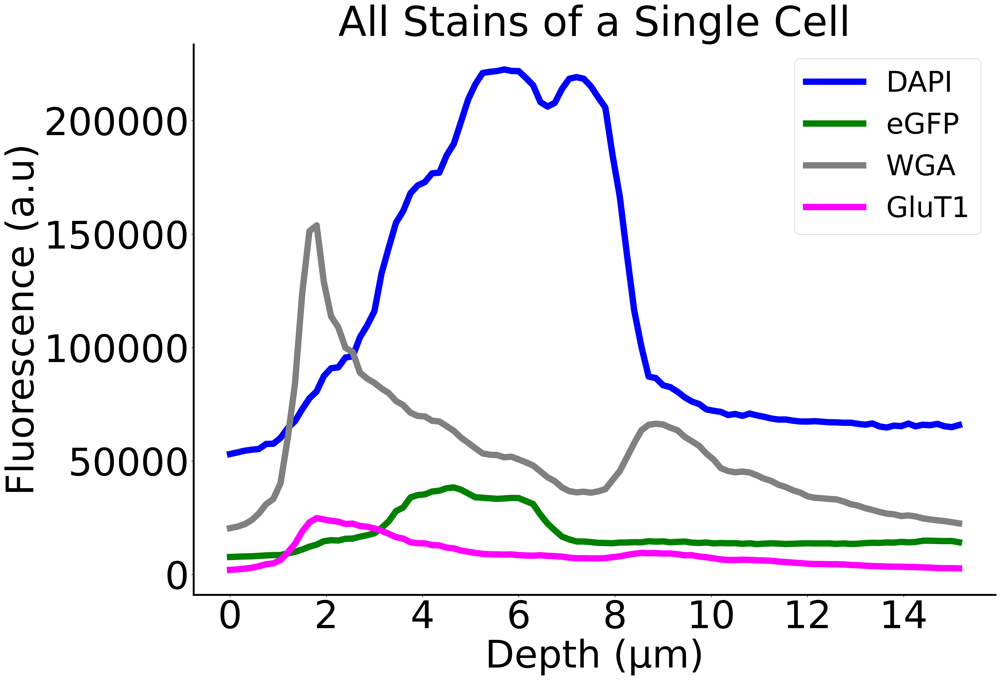

In [202]:
def plot_single_cell(single_cell):
    single_cell['Stain'] = single_cell['Stain'].apply(lambda x: 'GluT1' if x == 'GluT1' else x)
    
    stain_colors = {'WGA': 'grey', 'eGFP': 'green', 'GluT1': 'magenta', 'DAPI': 'blue'}

    plt.rcParams["axes.spines.right"] = False
    plt.rcParams["axes.spines.top"] = False
    plt.rcParams["axes.spines.bottom"] = True

    plt.figure(figsize=(22, 15))

    for index, row in single_cell.iterrows():
        stain_color = stain_colors.get(row['Stain'], 'gray')
        plt.plot(row['X_vals'], row['Y_vals'], linestyle='-', label=row['Stain'], color=stain_color, linewidth=10)
        
        # Peak picking for each line
        peaks, _ = find_peaks(row['Y_vals'], prominence=15, distance=20)
        x_peak = np.array(row['X_vals'])[peaks]
        y_peak = np.array(row['Y_vals'])[peaks]
        plt.plot(x_peak, y_peak, 'x', color=stain_color, linewidth=2)

    plt.xlabel('Depth (micron)', fontsize=60)
    plt.ylabel('Y Axis', fontsize=60)

    plt.yticks(fontsize=60)
    plt.xticks(fontsize=60)
    plt.xlabel('Depth (µm)', fontsize=60)
    plt.ylabel('Fluorescence (a.u)', fontsize=60)
    plt.title('All Stains of a Single Cell', fontsize = 65)
    plt.legend(fontsize = 45)

    ax = plt.gca()
    ax.spines['left'].set_linewidth(3)
    ax.spines['bottom'].set_linewidth(3)

    plt.tight_layout()
    plt.show()

# Example usage:
single_cell = df.query('mask_id == 14')
plot_single_cell(single_cell)
